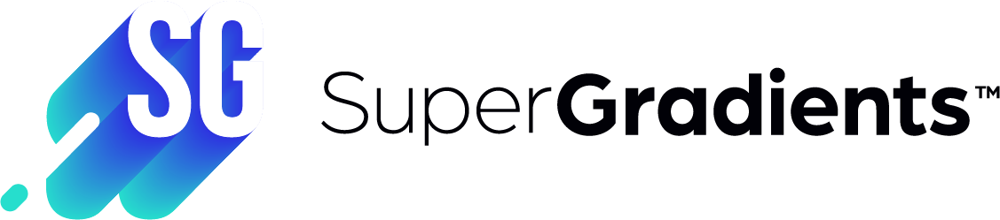

# Semantic Segmentation Transfer Learning with SuperGradients

In the following tutorial, we will demonstrate how to use one of SuperGradients pre-trained models and a custom dataset to improve the model's
accuracy using transfer learning for semantic segmentation.

Transfer Learning from a pre-trained checkpoint on your own dataset could prove to be very effective instead of deploying the pre-trained model directly on your data or training a model from scratch.
For more information on Transfer Learning, please visit: https://cs231n.github.io/transfer-learning/

In the following example, transfer learning will be used from a Cityscapes RegSeg model to a subset of the Supervisely person segmentation dataset .

For more details about the FILTERED dataset we will use see:
https://github.com/PaddlePaddle/PaddleSeg/tree/release/2.3/contrib/PP-HumanSeg


An example real-world use-case of the afformentioned scenario could be background removal in real time for video confrences.


The tutorial will be comprised of the following steps: 

1.   Define dataset parameters (including transformations), and initialize a dataset interface object
2.   Loading SuperGradients' pretrained Cityscapes RegSeg and adjust its architecture for the new task replacing its segmentation head
4.   Defining training parameters.
5.   Training the model. 



# Installation

In [1]:
! pip install https://deci-pretrained-models.s3.amazonaws.com/super_gradients-1.7.0rc2849-py3-none-any.whl gwpy &> /dev/null


# Imports

In [2]:
from super_gradients.training.datasets.dataset_interfaces.dataset_interface import SuperviselyPersonsDatasetInterface
from super_gradients.training.sg_model import SgModel
from super_gradients.training.metrics import BinaryIOU
from super_gradients.training.utils.segmentation_utils import ColorJitterSeg, RandomFlip, RandomRescale, \
    PadShortToCropSize, CropImageAndMask, ResizeSeg
from super_gradients.training.utils.callbacks import BinarySegmentationVisualizationCallback, Phase
from torchvision import transforms
import os


You did not mention an AWS environment.You can set the environment variable ENVIRONMENT_NAME with one of the values: development,staging,production
callbacks -WARNING- Failed to import deci_lab_client


# Download supervisely dataset

In [3]:
SUPERVISELY_DATASET_DOWNLOAD_PATH="/home/data"

supervisely_dataset_dir_path = SUPERVISELY_DATASET_DOWNLOAD_PATH + os.path.sep + 'supervisely-persons'

if os.path.isdir(supervisely_dataset_dir_path):
    print('supervisely dataset already downloaded...')
else:
    print('Downloading and extracting supervisely dataset to: ' + SUPERVISELY_DATASET_DOWNLOAD_PATH)
    ! mkdir $SUPERVISELY_DATASET_DOWNLOAD_PATH
    %cd $SUPERVISELY_DATASET_DOWNLOAD_PATH
    ! wget https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
    ! unzip --qq supervisely-persons.zip

/home/data
--2022-03-07 12:04:28--  https://deci-pretrained-models.s3.amazonaws.com/supervisely-persons.zip
Resolving deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)... 52.217.44.92
Connecting to deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)|52.217.44.92|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3564001012 (3.3G) [application/zip]
Saving to: ‘supervisely-persons.zip’

supervisely-persons 100%[===================>]   3.32G  68.5MB/s    in 51s     

2022-03-07 12:05:20 (66.7 MB/s) - ‘supervisely-persons.zip’ saved [3564001012/3564001012]



# Initializing a DatasetInterface Object

Here we define the dataset parameters such as batch size and augmentations (see docs for the full list of dataset_params).

Notice the call to connect_dataset_interface which will set trainer's classes attribute accoridng to the Supervisely person dataset (so in this case the single class ['person']). Such attributes are taken in acount when calling future methods such as build_model.

In [4]:
# DEFINE DATA TRANSFORMATIONS
dataset_params = {"dataset_dir": "/home/data/supervisely-persons",
                  "batch_size": 32,
                  "val_batch_size":32,
                  "image_mask_transforms_aug": transforms.Compose(
                      [ColorJitterSeg(brightness=0.5, contrast=0.5, saturation=0.5),
                       RandomFlip(),
                       RandomRescale(scales=[0.25, 1.]),
                       PadShortToCropSize([320, 480]),
                       CropImageAndMask(crop_size=[320, 480],
                                        mode="random")]),
                  "image_mask_transforms": transforms.Compose([ResizeSeg(h=480, w=320)])
                  }

dataset_interface = SuperviselyPersonsDatasetInterface(dataset_params)

trainer = SgModel("regseg48_transfer_learning",ckpt_root_dir="/home/data/notebook_ckpts/")

# CONNECTING THE DATASET INTERFACE WILL SET SGMODEL'S CLASSES ATTRIBUTE ACCORDING TO SUPERVISELY
trainer.connect_dataset_interface(dataset_interface, data_loader_num_workers=2)

# Preparing our model for transfer learning

This is where the magic happens - SuperGradients automatically replaces the head when loading a pre-trained model that was trained on a different number of classes than the new dataset that it is connected to.
In this example a new segmentation head layer is replaced with the old one to support

*Since the new number of classes in the Supervisely Person dataset (1 class) is different from the pre-trained model's number of classes
(20 classes- Cityscapes) build_model implicitly replaces the segmentation head automatically to train on the new dataset.


In [5]:
# THIS IS WHERE THE MAGIC HAPPENS- SINCE SGMODEL'S CLASSES ATTRIBUTE WAS SET TO BE DIFFERENT FROM CITYSCAPES'S, AFTER
# LOADING THE PRETRAINED REGSET, IT WILL CALL IT'S REPLACE_HEAD METHOD AND CHANGE IT'S SEGMENTATION HEAD LAYER ACCORDING
# TO OUR BINARY SEGMENTATION DATASET
trainer.build_model("regseg48", arch_params={"pretrained_weights": "cityscapes"})

Downloading: "https://deci-pretrained-models.s3.amazonaws.com/regseg48_cityscapes/ckpt_best.pth" to /root/.cache/torch/hub/checkpoints/regseg48_cityscapes_ckpt_best.pth


  0%|          | 0.00/38.9M [00:00<?, ?B/s]

# Defining training parameters

Here we define the training recipe. Although most parameters will probably look familiar, be sure to see our documentation of the full training parameters supported https://deci-ai.github.io/super-gradients/user_guide.html#training-parameters

We will be using an average of BCE and Dice loss for segmentation, with different learning rates for the replaced segmentation head layer, and the rest of the network- this is controlled by the `multiply_head_lr` parameter which is the multiplication factor of the learning rate for the newly replaced layer.

As our `metric_to_watch`, we will be monitoring the `target_IOU` which is ont of the components of `BinaryIOU` torchmetrics object (the other components are `mean_IOU` which is the mean of the background and target IOUs, and `background_IOU`). When not familiar with torchmetrics, and how they are integrated in SuperGradients see https://torchmetrics.readthedocs.io/en/latest/ , https://deci-ai.github.io/super-gradients/user_guide.html#integrating-your-training-code-complete-walkthrough-metrics .

In [6]:
# DEFINE TRAINING PARAMS. SEE DOCS FOR THE FULL LIST.
train_params = {"max_epochs": 50,
                "lr_mode": "cosine",
                "initial_lr": 0.0064,
                "optimizer_params": {"momentum": 0.843,
                                     "weight_decay": 0.00036,
                                     "nesterov": True},
                "batch_accumulate": 2,
                "cosine_final_lr_ratio": 0.1,
                "multiply_head_lr": 10,
                "optimizer": "SGD",
                "loss": "bce_dice_loss",
                "ema": True,
                "zero_weight_decay_on_bias_and_bn": True,
                "average_best_models": True,
                "mixed_precision": False,
                "metric_to_watch": "target_IOU",
                "greater_metric_to_watch_is_better": True,
                "train_metrics_list": [BinaryIOU()],
                "valid_metrics_list": [BinaryIOU()],
                "loss_logging_items_names": ["loss"],
                "phase_callbacks": [BinarySegmentationVisualizationCallback(phase=Phase.VALIDATION_BATCH_END,
                                                                            freq=1,
                                                                            last_img_idx_in_batch=4)],
                }

/usr/local/lib/python3.7/dist-packages/deprecate/deprecation.py:115: FutureWarning: The `IoU` was deprecated since v0.7 in favor of `torchmetrics.classification.jaccard.JaccardIndex`. It will be removed in v0.8.
  stream(template_mgs % msg_args)


# Start training
Make sure to visit the IMAGES tab inside tensorboard once every few epochs to see the predictions improvement on some sample images-  $\color {green}{\text{True positive pixels are segmented in Green}}$
$\color {blue}{\text{, False positive pixels are segmented in Blue}}$ and 
$\color {red}{\text{False negative pixels are segmented in Red}}$



In [ ]:
%load_ext tensorboard
%tensorboard --logdir /home/data/notebook_ckpts/ --bind_all

trainer.train(train_params)

<IPython.core.display.Javascript object>

sg_model -INFO- Using EMA with params {}
sg_model -INFO- Started training for 50 epochs (0/49)



Train epoch 0:   0%|          | 0/78 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/cuda/memory.py:386: FutureWarning: torch.cuda.memory_cached has been renamed to torch.cuda.memory_reserved
  FutureWarning)
Validation epoch 0: 100%|██████████| 17/17 [00:23<00:00,  1.37s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.8787640333175659


Validation epoch 1: 100%|██████████| 17/17 [00:23<00:00,  1.37s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.8856143355369568


Validation epoch 3: 100%|██████████| 17/17 [00:23<00:00,  1.37s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.9013423323631287


Validation epoch 4: 100%|██████████| 17/17 [00:23<00:00,  1.39s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.9133175611495972


Validation epoch 6: 100%|██████████| 17/17 [00:23<00:00,  1.38s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.9181761741638184


Validation epoch 7: 100%|██████████| 17/17 [00:23<00:00,  1.37s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.9183608889579773


Validation epoch 10: 100%|██████████| 17/17 [00:23<00:00,  1.36s/it]


base_sg_logger -INFO- Checkpoint saved in /home/data/notebook_ckpts/regseg48_transfer_learning_old_dice_diff_lrs_head_fixed_50_epochs/ckpt_best.pth
sg_model -INFO- Best checkpoint overriden: validation target_IOU: 0.9196188449859619


Train epoch 11:  54%|█████▍    | 42/78 [01:34<01:16,  2.13s/it, background_IOU=0.913, gpu_mem=6.32, loss=0.0768, mean_IOU=0.923, target_IOU=0.933]